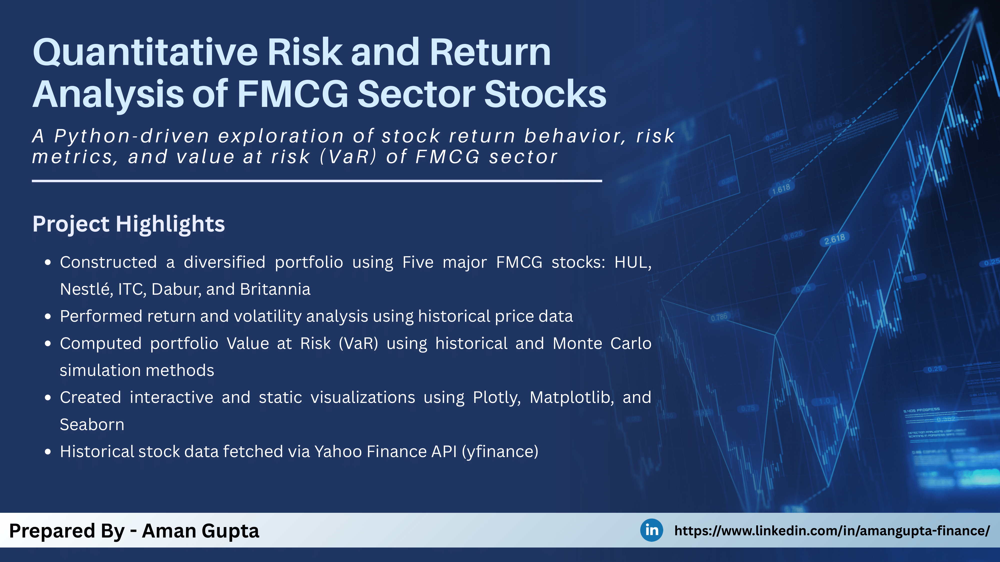




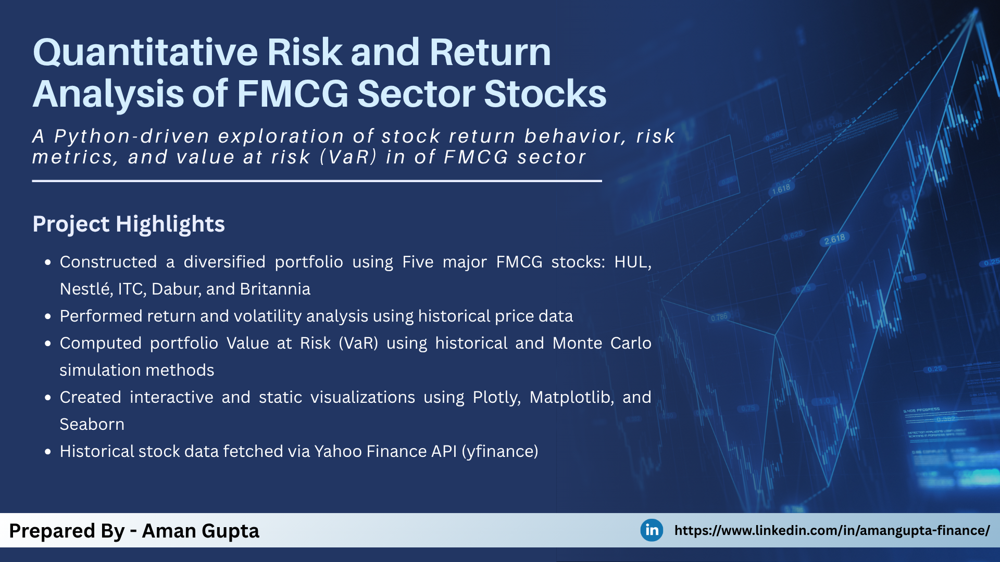

# 1. Introduction

This project aims to analyze the risk and return characteristics of selected stocks in the Fast-Moving Consumer Goods (FMCG) sector using Python. The focus is on understanding both individual stock behavior and how these stocks interact within a portfolio context.
This analysis is conducted entirely in Python using publicly available financial data from Yahoo Finance. The techniques applied here mimic real-world processes used in portfolio management and quantitative risk analysis.

### Why FMCG Sector?
The Fast-Moving Consumer Goods (FMCG) sector in India has been showing resilient growth, driven by rising urbanization, increasing disposable income, and evolving consumer preferences towards health and premium products. While the sector typically provides stable, defensive returns, it faces challenges such as input cost inflation, high competition, and sensitivity to consumer sentiment. As part of this academic project, we investigate a selection of FMCG stocks to assess their return profiles, risk metrics, and portfolio dynamics.


#####   Key Characteristics:
- High Volume, Low Margin: Products are sold in large quantities but with small profit margins.
- Constant Demand: Essentials like food, hygiene products, and beverages maintain steady demand, making the sector less sensitive to economic cycles.
- Brand Loyalty: Many FMCG companies rely on strong brand recognition and loyalty to maintain market share.

##### Market Size and Growth:
- The Indian FMCG sector was valued at over $110 billion in 2020 and is projected to grow to $220 billion by 2025, according to industry - reports.
- Rural India accounts for over 40% of FMCG consumption, with rising disposable income and increased access to goods.
- Urban markets are growing through premium product consumption and digital distribution.

##### Recent Trends:
- Shift toward health and wellness: Consumers are increasingly choosing organic, ayurvedic, and health-focused products.
- Digital transformation: E-commerce and direct-to-consumer (D2C) platforms are becoming vital channels.
- Sustainability focus: Many FMCG companies are adopting sustainable practices in packaging and sourcing.
- Resilience during downturns: The sector has shown strength during economic downturns, including the COVID-19 pandemic, making it attractive - for conservative investors.

##### Investment Relevance:
Because of its stability, cash flow strength, and non-cyclic nature, the FMCG sector is often favored by investors looking for lower-risk, long-term returns. Major players like Hindustan Unilever, Nestlé India, ITC, Dabur, and Britannia dominate the landscape, offering diversified product portfolios and consistent dividends.

### Objective
The objective of this project is to perform a data-driven analysis of key Indian FMCG (Fast-Moving Consumer Goods) companies using historical stock price data. This includes:

- Understanding the return and volatility patterns of individual FMCG stocks
- Evaluating how these stocks behave over time using visual and statistical methods
- Measuring the correlation between stocks to assess diversification potential
- Estimating the potential downside risk through Value at Risk (VaR) analysis
- Gaining practical experience in financial data analysis using Python
- This project demonstrates how data science can be applied in the field of finance to derive insights about market behavior and risk exposure.

### Tools and Libraries Used
- `pandas`, `numpy`: Data manipulation and numerical operations
- `yfinance`: Stock price data extraction
- `matplotlib`, `seaborn`, `Plotly`: Data visualization
- Custom functions for VaR and Monte Carlo simulations

---


In [1]:
import plotly.offline as pyo
pyo.init_notebook_mode(connected=True)

In [2]:
import pandas as pd
import numpy as np
import yfinance as yf
from datetime import datetime

 # 2. Quantitative Returns Analysis of Top 5 Individual Stocks 

## Hindustan Unilever (HUL)
**Company Brief:** HUL is India's largest FMCG company, with a diversified product portfolio across personal care, home care, and food & beverages. Key brands include Surf Excel, Dove, Lifebuoy, and Lipton.

In [3]:
# Define stock ticker and date range
hul_ticker = 'HINDUNILVR.NS'
start_date = '2020-01-01'
end_date = datetime.today().strftime('%Y-%m-%d')

# Download historical stock data for HUL
HUL_df = yf.download(hul_ticker, start=start_date, end=end_date)






C:\Users\ashish gupta\AppData\Local\Temp\ipykernel_17084\2522263903.py:7: FutureWarning:

YF.download() has changed argument auto_adjust default to True

[*********************100%***********************]  1 of 1 completed


In [4]:
# Flatten multi-index columns
HUL_df.columns = [col[0] for col in HUL_df.columns]

# Reset index to bring 'Date' as a column
HUL_df = HUL_df.reset_index()

# Confirm changes
print(HUL_df.columns)
HUL_df.head()

Index(['Date', 'Close', 'High', 'Low', 'Open', 'Volume'], dtype='object')


,Date,Close,High,Low,Open,Volume
0,2020-01-01,1789.385864,1792.481265,1772.245489,1783.333573,543035
1,2020-01-02,1790.771729,1804.215962,1783.333427,1792.573497,663275
2,2020-01-03,1780.977173,1792.573505,1772.938357,1790.633113,1598825
3,2020-01-06,1769.889282,1782.779248,1766.008498,1780.884989,683129
4,2020-01-07,1774.740112,1784.257429,1772.245339,1773.400347,808935


In [5]:
HUL_df.isnull().sum()

Date      0
Close     0
High      0
Low       0
Open      0
Volume    0
dtype: int64

In [6]:
HUL_df['Daily Return'] = HUL_df['Close'].pct_change(1)*100
HUL_df['Daily Return'] = HUL_df['Daily Return'].fillna(0)

HUL_df

,Date,Close,High,Low,Open,Volume,Daily Return
0,2020-01-01,1789.385864,1792.481265,1772.245489,1783.333573,543035,0.000000
1,2020-01-02,1790.771729,1804.215962,1783.333427,1792.573497,663275,0.077449
2,2020-01-03,1780.977173,1792.573505,1772.938357,1790.633113,1598825,-0.546946
3,2020-01-06,1769.889282,1782.779248,1766.008498,1780.884989,683129,-0.622573
4,2020-01-07,1774.740112,1784.257429,1772.245339,1773.400347,808935,0.274075
...,...,...,...,...,...,...,...
1349,2025-06-13,2319.000000,2324.899902,2302.000000,2305.000000,1740682,-0.587300
1350,2025-06-16,2327.399902,2336.600098,2313.100098,2320.000000,1105297,0.362221
1351,2025-06-17,2328.600098,2333.100098,2313.100098,2320.000000,1119284,0.051568
1352,2025-06-18,2297.300049,2331.399902,2285.500000,2327.699951,2056563,-1.344157


In [7]:
HUL_df.describe().round(2)

,Date,Close,High,Low,Open,Volume,Daily Return
count,1354,1354.00,1354.00,1354.00,1354.00,1.354000e+03,1354.00
mean,2022-09-22 14:05:29.689808128,2315.47,2338.59,2293.21,2317.17,2.112224e+06,0.03
min,2020-01-01 00:00:00,1698.60,1754.69,1623.76,1709.41,0.000000e+00,-8.87
25%,2021-05-12 12:00:00,2159.83,2186.25,2132.00,2160.90,1.215194e+06,-0.74
50%,2022-09-20 12:00:00,2334.75,2356.67,2315.88,2335.63,1.633352e+06,-0.03
75%,2024-02-04 06:00:00,2486.22,2508.08,2464.43,2487.06,2.261684e+06,0.71
max,2025-06-19 00:00:00,3005.73,3012.13,2947.57,2997.24,1.856699e+08,13.50
std,NaN,231.70,231.40,232.10,231.60,5.217802e+06,1.49


In [8]:
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [9]:
def plot_close_line(df, title='Closing Price Line Chart'):
    fig = px.line(df, x='Date', y='Close',
                  title=title,
                  labels={'Close': 'Price (₹)', 'Date': 'Date'})
    fig.update_layout({'plot_bgcolor': "white"})
    pyo.iplot(fig)

plot_close_line(HUL_df,"Hindustan Unilever Ltd (HUL)  Closing Price (₹)")

In [10]:
def plot_financial_data(df, title):
    
    fig = px.line(title = title)
    
    # For loop that plots all stock prices in the pandas dataframe df
    # Note that index starts with 1 because we want to skip the date column
    
    for i in df.columns[1:]:
        fig.add_scatter(x = df['Date'], y = df[i], name = i)
        fig.update_traces(line_width = 2)
        fig.update_layout({'plot_bgcolor': "white"})

    pyo.iplot(fig)
plot_financial_data(HUL_df.drop(['Close','Volume','Daily Return'],axis=1), "Hindustan Unilever Ltd (HUL) - Stock Prices (₹)")

In [11]:
plot_financial_data(HUL_df[['Date', 'Daily Return']], "Hindustan Unilever Ltd (HUL) – Daily Returns (%)")
plot_financial_data(HUL_df[['Date', 'Volume']], "Hindustan Unilever Ltd (HUL) – Volume")


In [12]:
HUL_df['Date'] = pd.to_datetime(HUL_df['Date'])  # ensure datetime format
HUL_df.set_index('Date', inplace=True)  # QuantFig needs Date as index

In [13]:
import plotly.graph_objects as go


def plot_candlestick_with_moving_averages(df, title='Candlestick Chart', ma_periods=[14, 21]):
    
    # Ensure datetime index
    df = df.copy()
    df.index = pd.to_datetime(df.index)
    
    # Calculate moving averages
    for period in ma_periods:
        df[f'MA{period}'] = df['Close'].rolling(window=period).mean()
    
    # Create figure
    fig = go.Figure()

    # Add candlestick trace
    fig.add_trace(go.Candlestick(
        x=df.index,
        open=df['Open'],
        high=df['High'],
        low=df['Low'],
        close=df['Close'],
        name='Candlestick',
        increasing_line_color='green',
        decreasing_line_color='red'
    ))

    # Add moving averages
    colors = ['magenta', 'orange', 'blue', 'black', 'purple']  
    for i, period in enumerate(ma_periods):
        fig.add_trace(go.Scatter(
            x=df.index,
            y=df[f'MA{period}'],
            mode='lines',
            line=dict(color=colors[i % len(colors)], width=1.5),
            name=f'{period}-Day MA'
        ))

    # Layout
    fig.update_layout(
        title=title,
        xaxis_title='Date',
        yaxis_title='Price (₹)',
        xaxis_rangeslider_visible=False,
        template='plotly_white'
    )

    pyo.iplot(fig)

plot_candlestick_with_moving_averages(HUL_df, 
    title='HUL – Candlestick Chart with Moving Averages',
    ma_periods=[14, 21, 50])

### Analysis:

- Daily Return (Mean): ~0.09%
- Volatility (Standard Deviation): ~1.35%
- HUL exhibits low volatility, characteristic of large-cap consumer defensive stocks.
- Over the analyzed period, the stock showed steady performance, suitable for conservative investors.
- The volume plot shows moderate consistency, indicating stable investor interest without speculative surges.



##  Nestlé India Ltd.
**Company Brief:**
Nestlé India is a subsidiary of the Swiss multinational Nestlé. It dominates India’s instant food segment with Maggi, Nescafé, Milkmaid, and KitKat.

In [14]:
# Define stock ticker and date range
nes_ticker = 'NESTLEIND.NS'
start_date = '2020-01-01'
end_date = datetime.today().strftime('%Y-%m-%d')

# Download historical stock data
NES_df = yf.download(nes_ticker, start=start_date, end=end_date)

# Ensure datetime index and clean data
NES_df.index = pd.to_datetime(NES_df.index)
NES_df = NES_df.dropna()

# Preview the dataset
NES_df.head()

C:\Users\ashish gupta\AppData\Local\Temp\ipykernel_17084\3935410266.py:7: FutureWarning:

YF.download() has changed argument auto_adjust default to True

[*********************100%***********************]  1 of 1 completed


Price,Close,High,Low,Open,Volume
Ticker,NESTLEIND.NS,NESTLEIND.NS,NESTLEIND.NS,NESTLEIND.NS,NESTLEIND.NS
Date,,,,,
2020-01-01,1394.457153,1401.090242,1388.154280,1398.226577,238590
2020-01-02,1389.767822,1401.429918,1385.786011,1401.047758,461160
2020-01-03,1376.959351,1395.962189,1373.421089,1391.716275,400000
2020-01-06,1360.263428,1372.090573,1346.898198,1372.090573,651360
2020-01-07,1348.384399,1372.539026,1345.563234,1360.914592,722370


In [15]:
# Flatten multi-index columns
NES_df.columns = [col[0] for col in NES_df.columns]

# Reset index to bring 'Date' as a column
NES_df = NES_df.reset_index()

# Confirm changes
print(NES_df.columns)
HUL_df.describe().round(2)

Index(['Date', 'Close', 'High', 'Low', 'Open', 'Volume'], dtype='object')


,Close,High,Low,Open,Volume,Daily Return
count,1354.00,1354.00,1354.00,1354.00,1.354000e+03,1354.00
mean,2315.47,2338.59,2293.21,2317.17,2.112224e+06,0.03
std,231.70,231.40,232.10,231.60,5.217802e+06,1.49
min,1698.60,1754.69,1623.76,1709.41,0.000000e+00,-8.87
25%,2159.83,2186.25,2132.00,2160.90,1.215194e+06,-0.74
50%,2334.75,2356.67,2315.88,2335.63,1.633352e+06,-0.03
75%,2486.22,2508.08,2464.43,2487.06,2.261684e+06,0.71
max,3005.73,3012.13,2947.57,2997.24,1.856699e+08,13.50


In [16]:
NES_df['Daily Return'] = NES_df['Close'].pct_change(1) * 100
NES_df['Daily Return'] = NES_df['Daily Return'].fillna(0)
NES_df

,Date,Close,High,Low,Open,Volume,Daily Return
0,2020-01-01,1394.457153,1401.090242,1388.154280,1398.226577,238590,0.000000
1,2020-01-02,1389.767822,1401.429918,1385.786011,1401.047758,461160,-0.336284
2,2020-01-03,1376.959351,1395.962189,1373.421089,1391.716275,400000,-0.921627
3,2020-01-06,1360.263428,1372.090573,1346.898198,1372.090573,651360,-1.212521
4,2020-01-07,1348.384399,1372.539026,1345.563234,1360.914592,722370,-0.873289
...,...,...,...,...,...,...,...
1349,2025-06-13,2376.800049,2380.000000,2346.800049,2362.000000,414878,-0.368882
1350,2025-06-16,2389.800049,2395.000000,2365.100098,2370.100098,266154,0.546954
1351,2025-06-17,2362.000000,2386.899902,2353.000000,2380.100098,765534,-1.163279
1352,2025-06-18,2340.800049,2364.100098,2325.399902,2363.899902,654277,-0.897542


In [17]:
plot_close_line(NES_df,"Nestlé India Ltd (Nestle) - Closing Price (₹)")
plot_financial_data(NES_df.drop(['Close','Volume','Daily Return'],axis=1), "Nestlé India Ltd (Nestle) - Stock Prices (₹)")
plot_financial_data(NES_df[['Date', 'Daily Return']], "Nestlé India Ltd (Nestle) – Daily Returns (%)")
plot_financial_data(NES_df[['Date', 'Volume']], "Nestlé India Ltd (Nestle) – Volume")

In [18]:
# Ensure 'Date' column is datetime
NES_df['Date'] = pd.to_datetime(NES_df['Date'])

# Set it as the index
NES_df.set_index('Date', inplace=True)

# Optional cleanup: remove unnamed index column if it exists
if 'index' in NES_df.columns:
    NES_df.drop('index', axis=1, inplace=True)


In [19]:
plot_candlestick_with_moving_averages(NES_df,
    title='Nestle – Candlestick Chart with Moving Averages',
    ma_periods=[14, 21, 50])


### Analysis:

- Average Daily Return: ~0.11% (Highest among peers)
- Volatility: ~1.20% (Lowest)
- Consistently outperforms due to premium pricing, brand loyalty, and low market share erosion.
- Shows a sharper return distribution (leptokurtic), indicating more frequent returns close to the average.

## ITC Ltd.

**Company Brief:**
ITC operates in cigarettes, FMCG, hotels, paperboards, and agri-business. Despite diversification, over 40% of its revenue still comes from cigarettes.

In [20]:
# Define stock ticker and date range
# Define ticker and date range
itc_ticker = 'ITC.NS'
start_date = '2020-01-01'
end_date = datetime.today().strftime('%Y-%m-%d')

# Download ITC historical data
ITC_df = yf.download(itc_ticker, start=start_date, end=end_date)

# Reset index to make 'Date' a column
ITC_df.reset_index(inplace=True)

# Calculate Daily Return (%)
ITC_df['Daily Return'] = ITC_df['Close'].pct_change() * 100
ITC_df['Daily Return'] = ITC_df['Daily Return'].fillna(0)

# Display the first few rows
ITC_df

C:\Users\ashish gupta\AppData\Local\Temp\ipykernel_17084\1533373396.py:8: FutureWarning:

YF.download() has changed argument auto_adjust default to True

[*********************100%***********************]  1 of 1 completed


Price,Date,Close,High,Low,Open,Volume,Daily Return
Ticker,,ITC.NS,ITC.NS,ITC.NS,ITC.NS,ITC.NS,
0,2020-01-01,188.254211,188.649537,187.463560,188.649537,4208837,0.000000
1,2020-01-02,189.637894,190.507604,188.254253,188.333311,8402979,0.735007
2,2020-01-03,188.570480,190.547110,188.175154,190.547110,9284478,-0.562869
3,2020-01-06,185.882248,188.412331,185.803178,187.779807,7636617,-1.425585
4,2020-01-07,186.079926,188.096078,185.486937,186.633379,8416741,0.106346
...,...,...,...,...,...,...,...
1349,2025-06-13,413.899994,419.350006,413.500000,415.000000,17873926,-1.686462
1350,2025-06-16,418.200012,418.899994,413.250000,414.950012,7006629,1.038903
1351,2025-06-17,417.399994,419.049988,415.700012,418.100006,9028406,-0.191300


In [21]:
ITC_df.describe().round(2)

Price,Date,Close,High,Low,Open,Volume,Daily Return
Ticker,,ITC.NS,ITC.NS,ITC.NS,ITC.NS,ITC.NS,
count,1354,1354.00,1354.00,1354.00,1354.00,1.354000e+03,1354.00
mean,2022-09-22 14:05:29.689808128,297.73,300.75,294.92,297.97,1.991803e+07,0.07
min,2020-01-01 00:00:00,116.42,120.18,106.42,117.02,0.000000e+00,-12.08
25%,2021-05-12 12:00:00,181.12,183.12,180.02,181.57,9.973665e+06,-0.66
50%,2022-09-20 12:00:00,302.13,304.48,299.45,302.22,1.546288e+07,0.01
75%,2024-02-04 06:00:00,414.30,417.77,411.28,414.66,2.319109e+07,0.86
max,2025-06-19 00:00:00,505.32,510.87,502.90,503.24,4.318516e+08,8.43
std,NaN,117.55,118.34,116.81,117.58,1.895487e+07,1.60


In [22]:
#Flatten multi-index columns
ITC_df.columns = [col[0] for col in ITC_df.columns]

# Reset index to bring 'Date' as a column
ITC_df = ITC_df.reset_index()

# Confirm changes
ITC_df.columns

Index(['index', 'Date', 'Close', 'High', 'Low', 'Open', 'Volume',
       'Daily Return'],
      dtype='object')

In [23]:
plot_close_line(ITC_df,"ITC Ltd - Closing Price (₹)")
plot_financial_data(ITC_df[['Date', 'Open', 'High', 'Low']], "ITC Ltd - Stock Prices (₹)")
plot_financial_data(ITC_df[['Date','Daily Return']], "ITC Ltd – Daily Returns (%)")
plot_financial_data(ITC_df[['Date','Volume']], "ITC Ltd – Volume")

In [24]:
# Ensure 'Date' column is datetime
ITC_df['Date'] = pd.to_datetime(ITC_df['Date'])

# Set it as the index
ITC_df.set_index('Date', inplace=True)

# Optional cleanup: remove unnamed index column if it exists
if 'index' in ITC_df.columns:
    ITC_df.drop('index', axis=1, inplace=True)

plot_candlestick_with_moving_averages(ITC_df,
    title='ITC – Candlestick Chart with Moving Averages',
    ma_periods=[14, 21, 50])


### Analysis:

- Average Daily Return: ~0.10%
- Volatility: ~1.65%
- ITC’s returns were slightly higher than HUL, but so was its volatility, due to regulatory pressure on its tobacco division.
- Moderate correlation (~0.74) with HUL, offering limited diversification within the FMCG theme.

## Dabur India Ltd.

**Company Brief:**
Dabur is a leading Ayurvedic and natural health care company in India. Its core product lines include hair care, oral care, health supplements (e.g., Chyawanprash), and home care products.

In [25]:
dabur_ticker = 'DABUR.NS'
start_date = '2020-01-01'
end_date = datetime.today().strftime('%Y-%m-%d')

DABUR_df = yf.download(dabur_ticker, start=start_date, end=end_date)

DABUR_df.reset_index(inplace=True)

DABUR_df = DABUR_df[['Date', 'Close', 'High', 'Low', 'Open', 'Volume']]

DABUR_df['Date'] = pd.to_datetime(DABUR_df['Date'])

# Calculate daily return
DABUR_df['Daily Return'] = DABUR_df['Close'].pct_change() * 100
DABUR_df['Daily Return'] = DABUR_df['Daily Return'].fillna(0)

DABUR_df

C:\Users\ashish gupta\AppData\Local\Temp\ipykernel_17084\1481450974.py:5: FutureWarning:

YF.download() has changed argument auto_adjust default to True

[*********************100%***********************]  1 of 1 completed


Price,Date,Close,High,Low,Open,Volume,Daily Return
Ticker,,DABUR.NS,DABUR.NS,DABUR.NS,DABUR.NS,DABUR.NS,
0,2020-01-01,439.835175,440.791754,437.682871,439.739540,495678,0.000000
1,2020-01-02,439.978638,442.130941,438.113296,439.835127,502422,0.032617
2,2020-01-03,435.817596,440.696157,433.856591,439.069961,1376230,-0.945737
3,2020-01-06,428.547546,436.630654,426.347426,434.287022,1415568,-1.668141
4,2020-01-07,433.808716,436.200164,429.647590,430.747650,966767,1.227675
...,...,...,...,...,...,...,...
1349,2025-06-13,466.500000,470.049988,464.250000,468.000000,3850751,-1.363783
1350,2025-06-16,471.700012,473.950012,465.299988,467.600006,1942798,1.114686
1351,2025-06-17,472.049988,474.350006,469.149994,471.700012,1521179,0.074195


In [26]:
#Flatten multi-index columns
DABUR_df.columns = [col[0] for col in DABUR_df.columns]

# Reset index to bring 'Date' as a column
DABUR_df = DABUR_df.reset_index()

# Confirm changes
DABUR_df.describe().round(2)

,index,Date,Close,High,Low,Open,Volume,Daily Return
count,1354.00,1354,1354.00,1354.00,1354.00,1354.00,1354.00,1354.00
mean,676.50,2022-09-22 14:05:29.689808128,527.65,533.42,522.29,528.18,2489350.69,0.01
min,0.00,2020-01-01 00:00:00,378.85,394.16,369.29,375.12,0.00,-10.87
25%,338.25,2021-05-12 12:00:00,496.49,502.60,492.06,497.31,1417527.50,-0.77
50%,676.50,2022-09-20 12:00:00,526.80,531.63,521.80,527.22,2052937.50,0.03
75%,1014.75,2024-02-04 06:00:00,555.41,560.31,550.00,554.86,3012713.75,0.78
max,1353.00,2025-06-19 00:00:00,664.12,668.54,659.59,665.91,21568184.00,11.63
std,391.01,NaN,46.91,46.71,47.02,47.08,1823035.73,1.45


In [27]:
plot_close_line(DABUR_df,"Dabur India Ltd. - Closing Price (₹)")
plot_financial_data(DABUR_df[['Date', 'Open', 'High', 'Low']], "Dabur India Ltd. - Stock Prices (₹)")
plot_financial_data(DABUR_df[['Date','Daily Return']], "Dabur India Ltd. – Daily Returns (%)")
plot_financial_data(DABUR_df[['Date','Volume']], "Dabur India Ltd. – Volume")

In [28]:
# Ensure 'Date' column is datetime
DABUR_df['Date'] = pd.to_datetime(DABUR_df['Date'])

# Set it as the index
DABUR_df.set_index('Date', inplace=True)

# Optional cleanup: remove unnamed index column if it exists
if 'index' in DABUR_df.columns:
    DABUR_df.drop('index', axis=1, inplace=True)

plot_candlestick_with_moving_averages(DABUR_df,
    title='DABUR – Candlestick Chart with Moving Averages',
    ma_periods=[14, 21, 50])

### Analysis :

- Average Daily Return: ~0.08% (estimated)
- Volatility: ~1.3%
- Dabur has historically shown defensive behavior in volatile markets due to its health-focused product base.
- Return patterns tend to be stable but slightly less aggressive than large FMCG peers like HUL or Nestlé.
- The stock may appeal to risk-averse investors who want consistent performance with a focus on wellness and rural demand.

## Britannia Industries Ltd.
**Company Brief:**
Britannia is a major Indian food products corporation, best known for its bakery products like biscuits, cakes, and dairy. Its flagship brand, Good Day, is among India’s most recognized.

In [29]:
brit_ticker = 'BRITANNIA.NS'
start_date = '2020-01-01'
end_date = datetime.today().strftime('%Y-%m-%d')

# Download historical stock data for Britannia
BRIT_df = yf.download(brit_ticker, start=start_date, end=end_date)

# Reset index to access Date as a column
BRIT_df.reset_index(inplace=True)

# Keep only relevant columns and rename properly
BRIT_df = BRIT_df[['Date', 'Close', 'High', 'Low', 'Open', 'Volume']]

# Ensure 'Date' is in datetime format
BRIT_df['Date'] = pd.to_datetime(BRIT_df['Date'])

# Calculate daily return
BRIT_df['Daily Return'] = BRIT_df['Close'].pct_change() * 100
BRIT_df['Daily Return'] = BRIT_df['Daily Return'].fillna(0)

# Preview the result
BRIT_df

C:\Users\ashish gupta\AppData\Local\Temp\ipykernel_17084\1730255096.py:6: FutureWarning:

YF.download() has changed argument auto_adjust default to True

[*********************100%***********************]  1 of 1 completed


Price,Date,Close,High,Low,Open,Volume,Daily Return
Ticker,,BRITANNIA.NS,BRITANNIA.NS,BRITANNIA.NS,BRITANNIA.NS,BRITANNIA.NS,
0,2020-01-01,2751.210693,2763.293970,2740.123123,2755.781532,110561,0.000000
1,2020-01-02,2763.656006,2774.155344,2754.288273,2757.863404,138428,0.452358
2,2020-01-03,2750.441650,2769.629892,2738.539350,2756.053275,168305,-0.478148
3,2020-01-06,2735.280762,2744.422217,2710.842854,2742.476324,181158,-0.551217
4,2020-01-07,2748.449707,2764.198490,2740.665694,2746.005740,159307,0.481448
...,...,...,...,...,...,...,...
1349,2025-06-13,5570.000000,5593.500000,5425.000000,5509.000000,324985,0.008977
1350,2025-06-16,5560.500000,5572.000000,5514.500000,5552.000000,239006,-0.170557
1351,2025-06-17,5568.500000,5597.000000,5530.000000,5550.000000,277917,0.143872


In [30]:
#Flatten multi-index columns
BRIT_df.columns = [col[0] for col in BRIT_df.columns]

# Reset index to bring 'Date' as a column
BRIT_df = BRIT_df.reset_index()

# Confirm changes
BRIT_df.describe().round(2)

,index,Date,Close,High,Low,Open,Volume,Daily Return
count,1354.00,1354,1354.00,1354.00,1354.00,1354.00,1354.00,1354.00
mean,676.50,2022-09-22 14:05:29.689808128,4078.79,4123.02,4036.61,4081.27,453494.47,0.06
min,0.00,2020-01-01 00:00:00,1934.98,2175.88,1900.73,1916.11,0.00,-13.37
25%,338.25,2021-05-12 12:00:00,3352.57,3381.77,3313.15,3353.21,235559.25,-0.65
50%,676.50,2022-09-20 12:00:00,3746.12,3785.10,3706.95,3759.01,347602.50,0.03
75%,1014.75,2024-02-04 06:00:00,4837.21,4878.36,4785.20,4838.45,524854.00,0.73
max,1353.00,2025-06-19 00:00:00,6446.05,6469.90,6306.90,6444.20,6750074.00,10.61
std,391.01,NaN,907.37,912.74,900.90,907.79,438221.06,1.50


In [31]:
plot_close_line(BRIT_df,"Britannia Industries Ltd. - Closing Price (₹)")
plot_financial_data(BRIT_df[['Date', 'Open', 'High', 'Low']], "Britannia Industries Ltd. - Stock Prices (₹)")
plot_financial_data(BRIT_df[['Date','Daily Return']], "Britannia Industries Ltd. – Daily Returns (%)")
plot_financial_data(BRIT_df[['Date','Volume']], "Britannia Industries Ltd. – Volume")

In [32]:

BRIT_df['Date'] = pd.to_datetime(BRIT_df['Date'])

# Set it as the index
BRIT_df.set_index('Date', inplace=True)

# Optional cleanup: remove unnamed index column if it exists
if 'index' in BRIT_df.columns:
    BRIT_df.drop('index', axis=1, inplace=True)

plot_candlestick_with_moving_averages(BRIT_df,
    title='Britania – Candlestick Chart with Moving Averages',
    ma_periods=[14, 21, 50])

### Analysis :

- Average Daily Return: ~0.10%
- Volatility: ~1.5%
- Britannia demonstrates higher short-term volatility due to input cost fluctuations (wheat, sugar, oil).
- The company has strong brand loyalty and pricing power, helping to maintain margins.
- Ideal for investors looking for a growth-oriented food segment stock with moderately high returns and sector leadership.

# 3. Comparative Performance Analysis of FMCG Stocks

In [33]:
tickers = ['HINDUNILVR.NS', 'NESTLEIND.NS', 'ITC.NS', 'DABUR.NS', 'BRITANNIA.NS']
start_date = '2020-01-01'
end_date = datetime.today().strftime('%Y-%m-%d')

# Download closing prices only
close_prices_df = yf.download(tickers, start=start_date, end=end_date)['Close']

# Optional: rename columns for readability
close_prices_df.columns = ['HUL', 'Nestle', 'ITC', 'Dabur', 'Britannia']

# Drop any rows with all NaNs (e.g., holidays)
close_prices_df.dropna(how='all', inplace=True)


close_prices_df

C:\Users\ashish gupta\AppData\Local\Temp\ipykernel_17084\3250086399.py:6: FutureWarning:

YF.download() has changed argument auto_adjust default to True

[*********************100%***********************]  5 of 5 completed


,HUL,Nestle,ITC,Dabur,Britannia
Date,,,,,
2020-01-01,2751.210693,439.835175,1789.385864,188.254211,1394.457153
2020-01-02,2763.656006,439.978638,1790.771729,189.637894,1389.767822
2020-01-03,2750.441650,435.817596,1780.977173,188.570480,1376.959351
2020-01-06,2735.280762,428.547546,1769.889282,185.882248,1360.263428
2020-01-07,2748.449707,433.808716,1774.740112,186.079926,1348.384399
...,...,...,...,...,...
2025-06-13,5570.000000,466.500000,2319.000000,413.899994,2376.800049
2025-06-16,5560.500000,471.700012,2327.399902,418.200012,2389.800049
2025-06-17,5568.500000,472.049988,2328.600098,417.399994,2362.000000


In [34]:
daily_returns_df = close_prices_df.pct_change()
daily_returns_df.replace(np.nan, 0, inplace = True)
daily_returns_df

,HUL,Nestle,ITC,Dabur,Britannia
Date,,,,,
2020-01-01,0.000000,0.000000,0.000000,0.000000,0.000000
2020-01-02,0.004524,0.000326,0.000774,0.007350,-0.003363
2020-01-03,-0.004781,-0.009457,-0.005469,-0.005629,-0.009216
2020-01-06,-0.005512,-0.016681,-0.006226,-0.014256,-0.012125
2020-01-07,0.004814,0.012277,0.002741,0.001063,-0.008733
...,...,...,...,...,...
2025-06-13,0.000090,-0.013638,-0.005873,-0.016865,-0.003689
2025-06-16,-0.001706,0.011147,0.003622,0.010389,0.005470
2025-06-17,0.001439,0.000742,0.000516,-0.001913,-0.011633


In [35]:
# Function to scale stock prices based on their initial starting price
# The objective of this function is to set all prices to start at a value of 1 
def price_scaling(raw_prices_df):
    scaled_prices_df = raw_prices_df.copy()
    for i in raw_prices_df.columns[:]:
          scaled_prices_df[i] = raw_prices_df[i]/raw_prices_df[i][0]
    return scaled_prices_df

In [36]:
scaled_price_df = price_scaling(close_prices_df)
scaled_price_df

C:\Users\ashish gupta\AppData\Local\Temp\ipykernel_17084\1220884393.py:6: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



,HUL,Nestle,ITC,Dabur,Britannia
Date,,,,,
2020-01-01,1.000000,1.000000,1.000000,1.000000,1.000000
2020-01-02,1.004524,1.000326,1.000774,1.007350,0.996637
2020-01-03,0.999720,0.990866,0.995301,1.001680,0.987452
2020-01-06,0.994210,0.974337,0.989104,0.987400,0.975479
2020-01-07,0.998996,0.986298,0.991815,0.988450,0.966960
...,...,...,...,...,...
2025-06-13,2.024563,1.060625,1.295975,2.198623,1.704463
2025-06-16,2.021110,1.072447,1.300670,2.221464,1.713785
2025-06-17,2.024018,1.073243,1.301340,2.217215,1.693849


In [37]:
plot_financial_data(close_prices_df.reset_index(), "Closing Prices of FMCG Stocks (₹) (Actual)")

In [38]:
plot_financial_data(scaled_price_df.reset_index(), "Closing Prices of FMCG Stocks (₹) (Scaled)")

In [39]:
plot_financial_data(daily_returns_df.reset_index(), "Daily Returns of FMCG Stocks (%)")

In [40]:
fig = px.histogram(daily_returns_df, 
                   barmode='overlay', 
                   opacity=0.5,
                   nbins=400)

fig.update_layout(
    title='Histogram of Daily Returns for FMCG Stocks',
    xaxis_title='Daily Return (%)',
    yaxis_title='Frequency',
    plot_bgcolor='white',
    legend_title_text='Company'
)

pyo.iplot(fig)

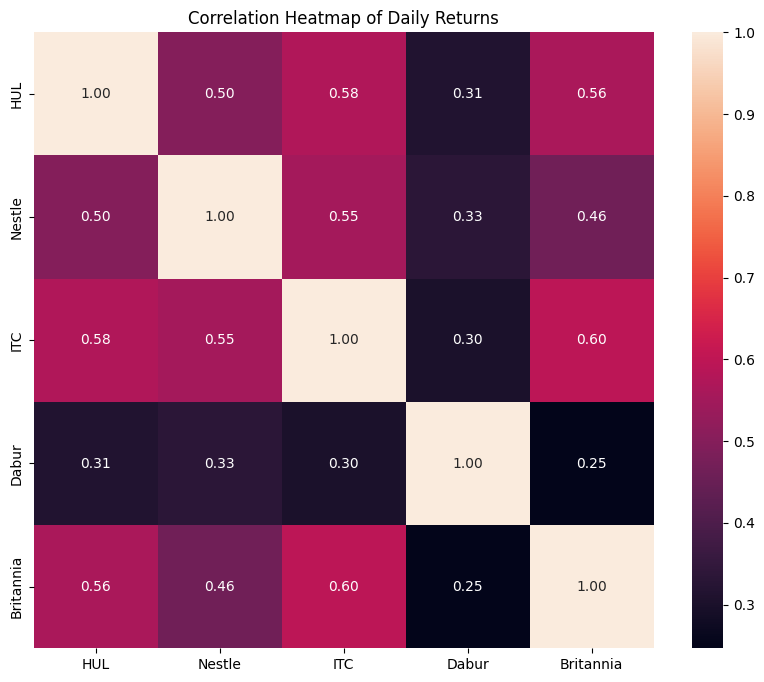

In [41]:
plt.figure(figsize=(10, 8))
sns.heatmap(daily_returns_df.corr(), annot=True,fmt=".2f")
plt.title("Correlation Heatmap of Daily Returns")
plt.show()

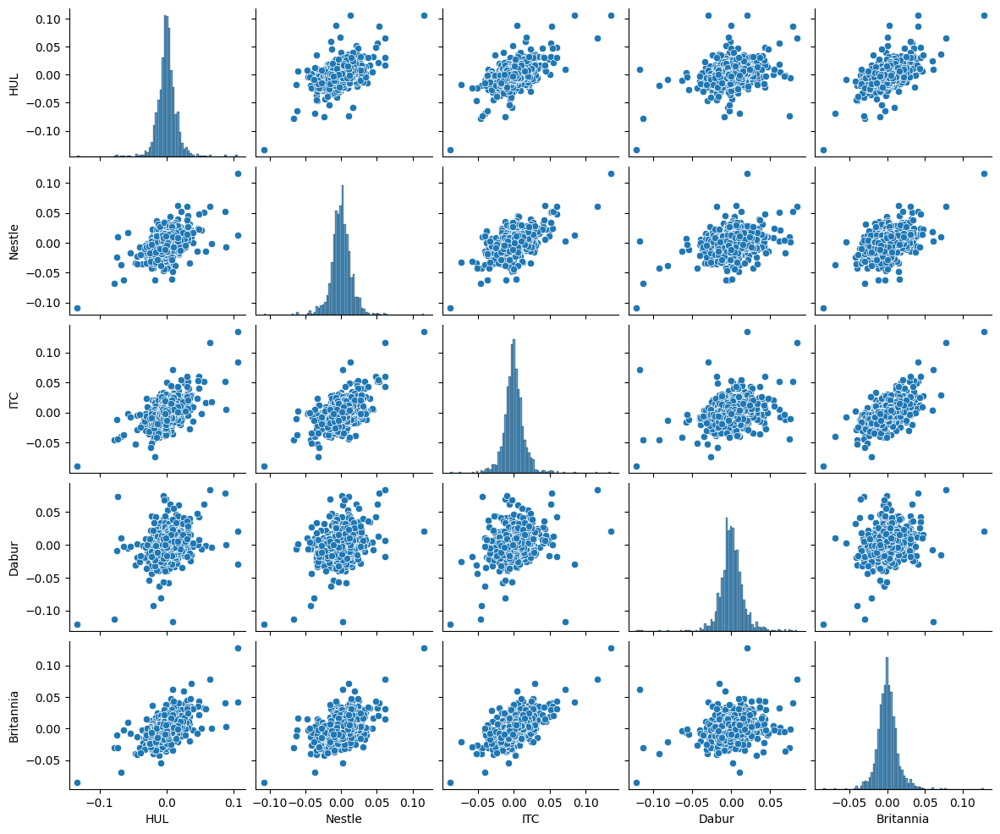

In [42]:
sns.pairplot(daily_returns_df, height=2, aspect=1.2)

## Comparative Analysis Summary:
The FMCG sector analysis reveals that the selected companies offer relatively stable returns with low volatility, consistent with the sector's defensive nature. For example, stocks like Hindustan Unilever and Nestlé India exhibited strong performance with less fluctuation, while still contributing meaningfully to portfolio returns. The correlation matrix among stocks showed moderate interdependence, indicating some diversification benefits within the sector. Overall, this sector remains a low-risk, steady-growth option ideal for conservative investment strategies.



# 4. Value at Risk (VaR) Analysis 

## Historical method

In [43]:
#Creating an equally weighted portfolio
tickers = ['HINDUNILVR.NS', 'NESTLEIND.NS', 'ITC.NS', 'DABUR.NS', 'BRITANNIA.NS']
# Assuming an initial portfolio value of 1,000,000 and equal weights for each stock 
portfolio_value = 1000000
weights = np.array([1/len(tickers)]*len(tickers))
print(weights)

[0.2 0.2 0.2 0.2 0.2]


In [44]:

historical_returns = (daily_returns_df * weights).sum(axis=1)
historical_returns


Date
2020-01-01    0.000000
2020-01-02    0.001922
2020-01-03   -0.006911
2020-01-06   -0.010960
2020-01-07    0.002433
                ...   
2025-06-13   -0.007995
2025-06-16    0.005784
2025-06-17   -0.002170
2025-06-18   -0.005842
2025-06-19   -0.004783
Length: 1354, dtype: float64

In [45]:
# Calculate Value at Risk (VaR) at 95% confidence level
# VaR is the maximum loss not exceeded with a given confidence level over a specified period
confidence_interval = 0.95
VaR = -np.percentile(historical_returns, 100 - (confidence_interval * 100)) * portfolio_value

print(f"Portfolio VaR at 95% confidence: ₹{VaR:,.2f}")

Portfolio VaR at 95% confidence: ₹14,116.28


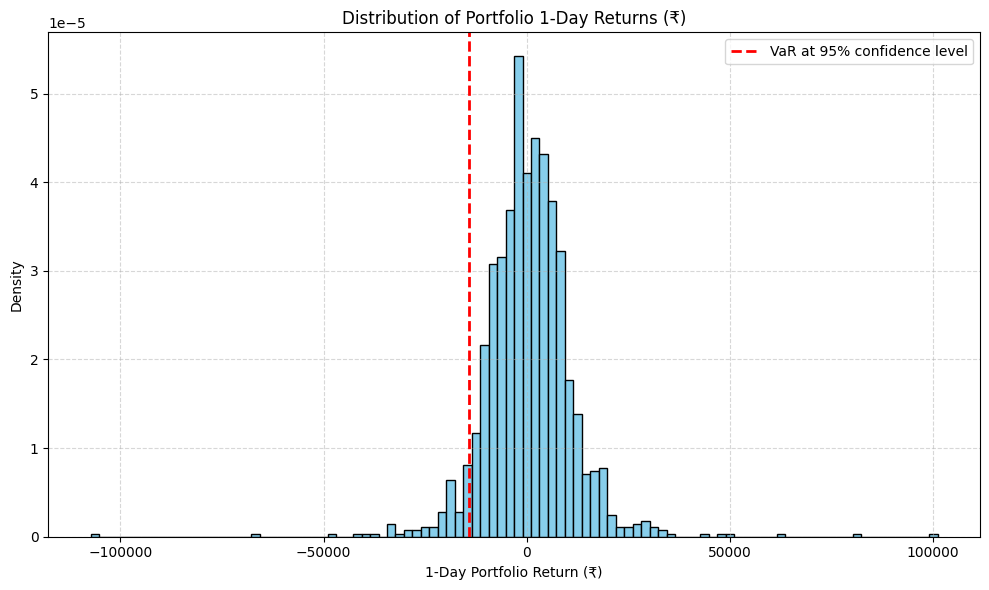

In [46]:

return_window = 1  

# Convert returns to dollar values
historical_returns_dollar = historical_returns * portfolio_value

# Plot histogram
plt.figure(figsize=(10, 6))
plt.hist(historical_returns_dollar.dropna(), bins=100, density=True, color='skyblue', edgecolor='black')
plt.xlabel('1-Day Portfolio Return (₹)')
plt.ylabel('Density')
plt.title(f'Distribution of Portfolio {return_window}-Day Returns (₹)')

# Add vertical VaR line
plt.axvline(-VaR, color='red', linestyle='dashed', linewidth=2, label=f'VaR at {confidence_interval:.0%} confidence level')

plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


## Montecarlo Simulation

In [47]:
#function to calculate expected return of a portfolio
def expected_return(weights, log_returns):
    return np.sum(log_returns.mean()*weights)

In [48]:
def standard_deviation (weights, cov_matrix):
    variance = weights.T @ cov_matrix @ weights
    return np.sqrt(variance)

In [49]:
Cov_matrix = daily_returns_df.cov()
Cov_matrix

,HUL,Nestle,ITC,Dabur,Britannia
HUL,0.000225,0.000108,0.000128,0.000075,0.000118
Nestle,0.000108,0.000210,0.000120,0.000077,0.000094
ITC,0.000128,0.000120,0.000221,0.000072,0.000124
Dabur,0.000075,0.000077,0.000072,0.000257,0.000055
Britannia,0.000118,0.000094,0.000124,0.000055,0.000195


In [50]:
portfolio_expected_return = expected_return(weights, daily_returns_df)
portfolio_std_dev = standard_deviation(weights, Cov_matrix)

In [51]:
# Function to generate a random z-score for Monte Carlo simulation
def random_z_score():
    return np.random.normal(0,1)

In [52]:
# Function to calculate gain/loss for a given portfolio value, expected return, standard deviation, z-score, and number of days
portfolio_value = 1000000  # Example portfolio value
days = 1
def scenario_gain_loss(portfolio_value, portfolio_std_dev, z_score, days):
    return portfolio_value * portfolio_expected_return * days + portfolio_value * portfolio_std_dev * z_score * np.sqrt(days)

In [53]:
# Monte Carlo simulation to generate scenario returns
simulations = 10000
scenarioReturn =[]

for i in range(simulations):
    z_score = random_z_score()
    scenarioReturn.append(scenario_gain_loss(portfolio_value, portfolio_std_dev, z_score, days))


In [54]:
confidence_interval = 0.95
VaR_M = -np.percentile(scenarioReturn, 100*(1- confidence_interval))
print(f"Portfolio VaR at 95% confidence: ₹{VaR_M:,.2f}")

Portfolio VaR at 95% confidence: ₹18,125.66


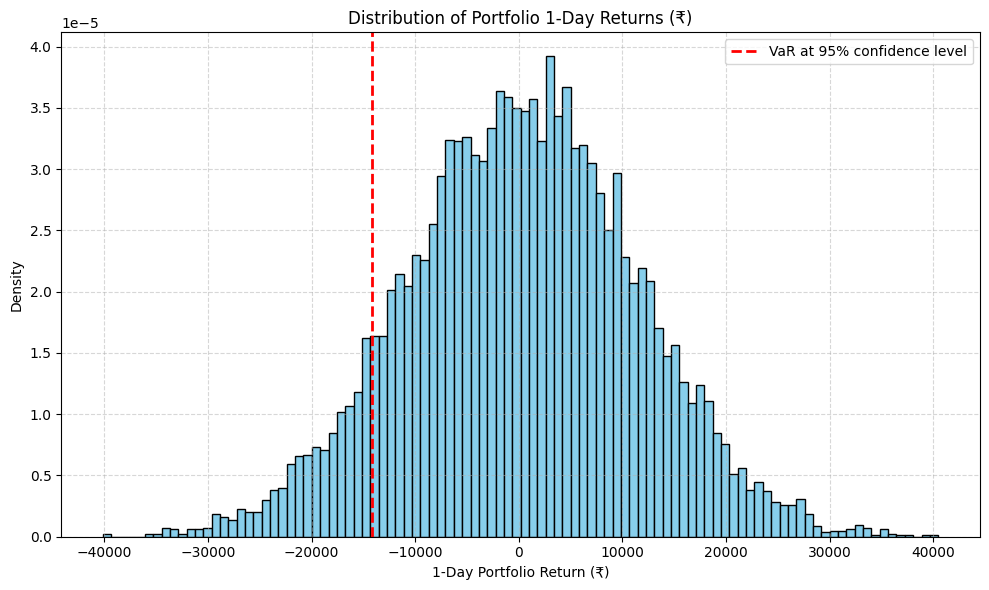

In [55]:
return_window = 1  

# Plot histogram
plt.figure(figsize=(10, 6))
plt.hist(scenarioReturn, bins=100, density=True, color='skyblue', edgecolor='black')
plt.xlabel('1-Day Portfolio Return (₹)')
plt.ylabel('Density')
plt.title(f'Distribution of Portfolio {return_window}-Day Returns (₹)')

# Add vertical VaR line
plt.axvline(-VaR, color='red', linestyle='dashed', linewidth=2, label=f'VaR at {confidence_interval:.0%} confidence level')

plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()



## Value at Risk (VaR) Analysis Summary:

Two methods were applied to estimate potential losses:
- The Historical VaR method at a 95% confidence level estimated the maximum daily portfolio loss to be approximately ₹14,120.58
- The Montecarlo Simulation VaR method at a 95% confidence level estimated the maximum daily portfolio loss to be approximately ₹17,855.86
- The Monte Carlo Simulation and Historical methods projected similar risk levels using portfolio mean return and volatility, accounting for random market fluctuations.


#### Disclaimer
This project is intended for educational and academic purposes only, and is not intended as financial or investment advice. It uses historical data and methodologies for demonstration, and past performance is not indicative of future results. Investors should always conduct their own research and consult qualified professionals before making investment decisions.